In [11]:
from googleapiclient.discovery import build

import sys
from utils import auth
from settings import TOKEN_PATH, CREDENTIALS_DESKTOP_PATH, SCOPES

creds = auth(credentials_path=CREDENTIALS_DESKTOP_PATH, token_path=TOKEN_PATH, scopes=SCOPES)
google_photos = build('photoslibrary', 'v1', credentials=creds, static_discovery=False)

In [5]:
albums = google_photos.albums().list().execute()

In [6]:
album_id = albums["albums"][0]["id"]

In [7]:
album = google_photos.albums().get(albumId=album_id).execute()

In [8]:
album

{'id': 'AEAO9NBCvtGZGxusm0I03he5b2T2Epo_zWsqEagPvyCzsIij3tIrHoiAFxeZ_804nuov_0JWQTRI',
 'title': '2023 Iceland',
 'productUrl': 'https://photos.google.com/lr/album/AEAO9NBCvtGZGxusm0I03he5b2T2Epo_zWsqEagPvyCzsIij3tIrHoiAFxeZ_804nuov_0JWQTRI',
 'mediaItemsCount': '359',
 'coverPhotoBaseUrl': 'https://lh3.googleusercontent.com/lr/AAJ1LKfCtS-JkmTZKou2UOZLDV4U3tSc23BWA_j8t8JsyosIbIS5SQB1ayydsbmobL_90F98yfqdSt6BGfEBW75uWmShTasu1T3IVbkQkoeD3wpIHz3twIRxyVgQFFMomJNWs-92IIo_MfR0rdgMvToolIhnR5Cel0P7L7tntmKptcug-UfhKi-1GIqpMkUWvGG1bqX7ZMIXm6g4lI97ysRNmPGcwXMpLNje--qBwlJc2m3m4j6QRBohm-5CzZEQTJZaT4i-E1X7WtZ25ogo4Nuvr5RVl817HC24RlS47_rDuyClW0-NOtu2E2OQ26f2g9EN0dhIwXNp0goDxtQmmHb8x_DwPuiTY_uiQPiY3evCtMV6-oy22593I96bxmKkGe-y_iWFmSgJ-oD5jE48dul--pYSK4BShObvu4WRn-w9bX8RfYdVkY-2vwpMzofxJ4WBoYw9b4EYx2t1DjYkzX6mwzZB7X1XvCbjW7n6kmY-WWq4yKu4VwfD3ilrVLObOqLP6NW9IkYnZ6xLUa4kP39jdwWNNsHSm_4QtfSiA3nvdeTEETzaYVuyruPRgH6qle8x67rs1SwNDReFeJWFILsHsB_7xnaD_bvGu90CkrqLNjtrOAFCaLHEFvwbeodgYjqRfG4Rg3eBFR294H1LAre_y8ldev

In [50]:
# Define the request parameters to search for media items in the album
request_body = {
    "albumId": album_id,
    "pageSize": 2
    }

response = google_photos.mediaItems().search(body=request_body).execute()


In [51]:
media_item = response["mediaItems"][0]

In [52]:
download_url = media_item["baseUrl"]+"=d"

In [53]:
import requests
from PIL import Image
import io


def mediaItem2PIL(url):
    response = requests.get(url)
    if response.status_code == 200:
        return Image.open(io.BytesIO(response.content))
    else:
        print("Failed to download the image.")


In [54]:
image = mediaItem2PIL(download_url)

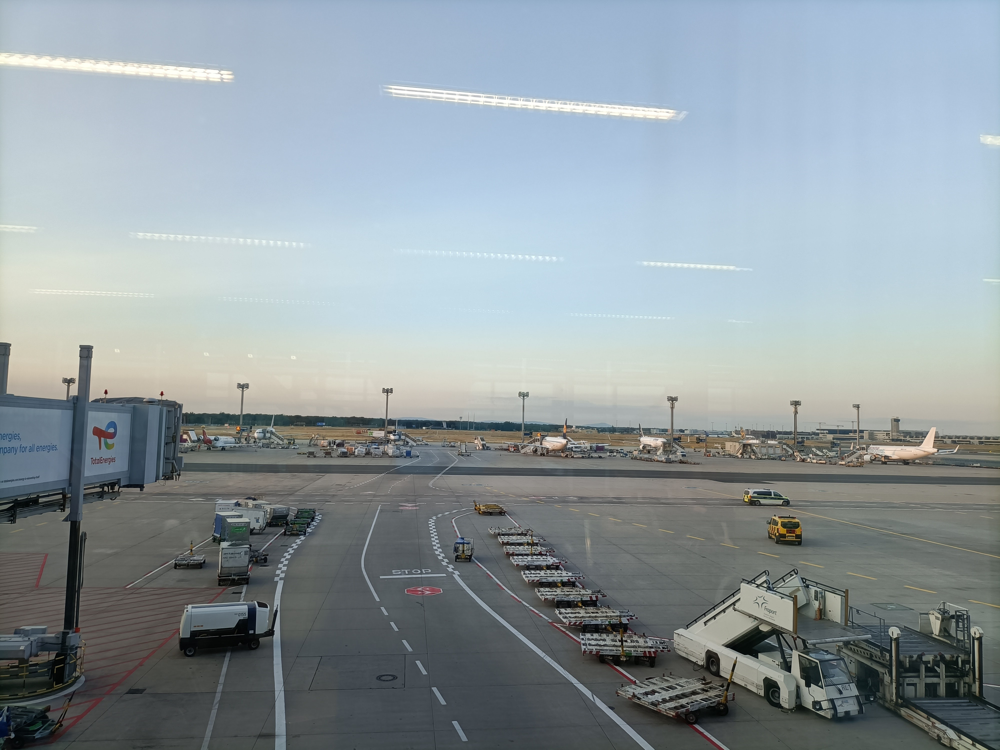

In [55]:
image